In [1]:
import networkx as nx
import matplotlib.pyplot as plt
from termcolor import cprint
from matplotlib.patches import Rectangle

In [2]:
MORENO_RESIDENCE_HALL_FILE = 'networks/moreno_residence_hall.txt'

# Residence-Hall-Network

(Directed)

This directed network contains friendship ratings between 217 residents living at a residence hall located on the Australian National University campus. A node represents a person and 
an edge represents a friendship tie.  The friendships are weighted as follows from strongest to weakest tie:  5 (best friend), 4 (close friend), 3 (friend), 2, 1.

In [3]:
G = nx.read_weighted_edgelist(MORENO_RESIDENCE_HALL_FILE, create_using= nx.DiGraph, nodetype=int)
cprint(nx.info(G),'green')

DiGraph with 217 nodes and 2672 edges


In [4]:
def draw_graph(pos,nodecolors):
    plt.figure(3, figsize=(30, 30))
    edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())
    nx.draw(G,node_color=nodecolors, node_size=1000,arrowsize=20, pos=pos, edgelist = edges, edge_color = weights, edge_cmap = plt.cm.Greys, edge_vmin=0.0, edge_vmax=5.0, width=0.7)
    nx.draw_networkx_labels(G,  horizontalalignment='center', verticalalignment='center',font_color='black', font_weight='bold', pos=pos)
    ax=plt.gca()
    ax.collections[0].set_edgecolor("#000000")
    plt.show()


## Spring Layout

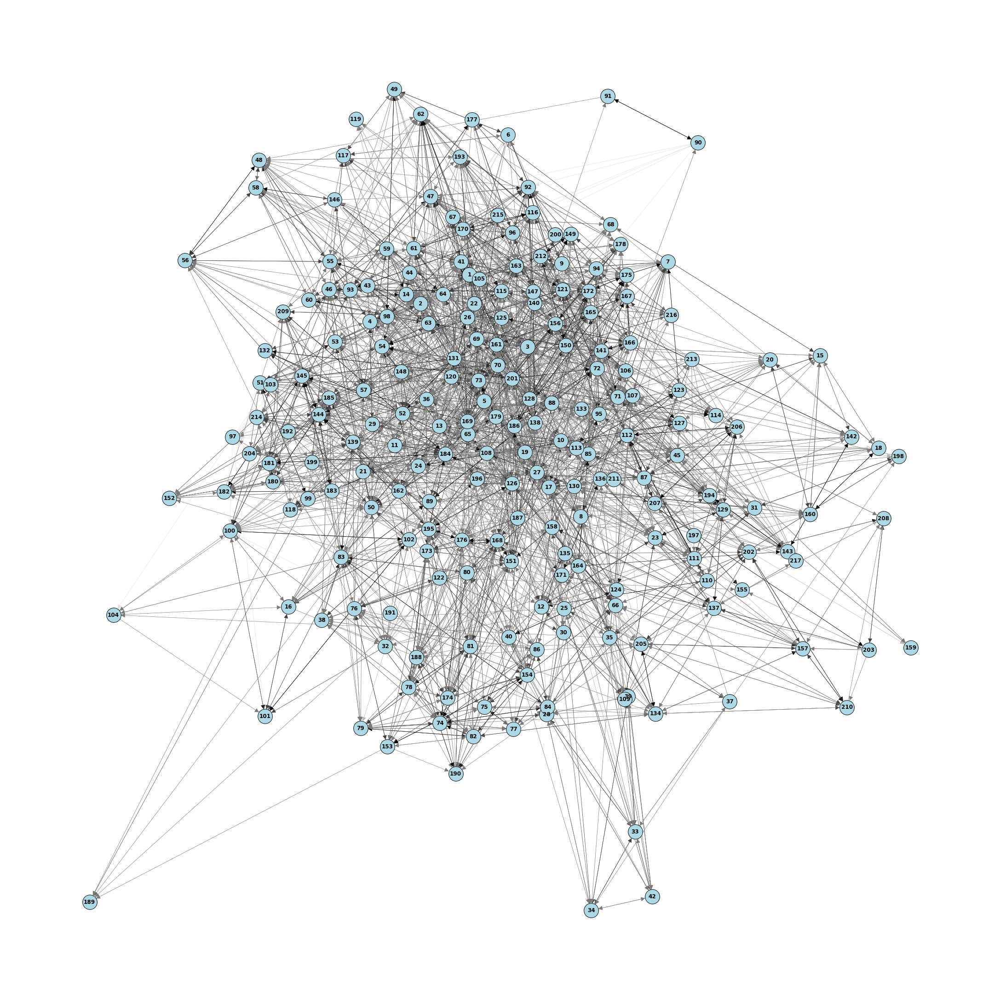

In [19]:
pos_spring = nx.spring_layout(G, k=0.6, iterations=50)
draw_graph(pos_spring,'#add8e6')

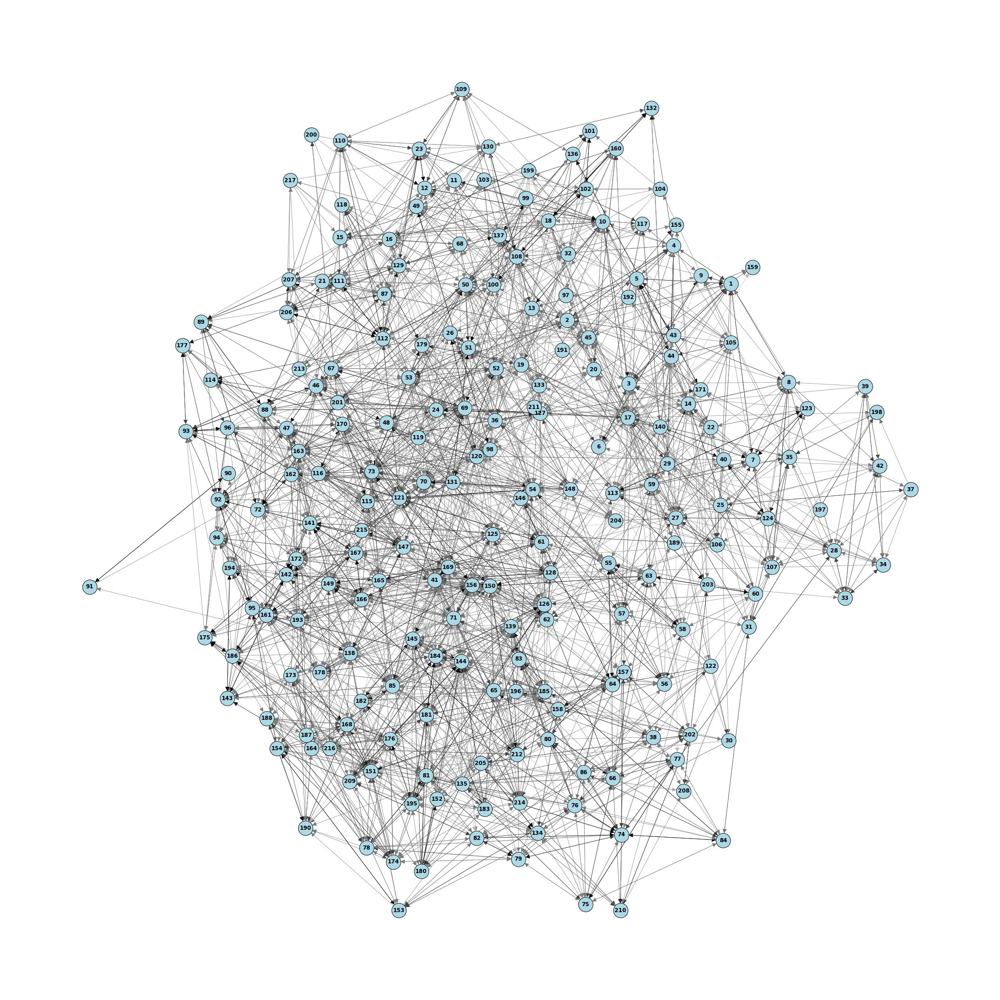

In [20]:
pos_kawai = nx.kamada_kawai_layout(G)
draw_graph(pos_kawai,'#add8e6')

# Connected components

In [7]:
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
nodes = G.nodes()
edges = G.edges()

In [8]:
cprint("The network is a unique stongly connected component: ",'blue', end=' ') 
cprint(str(nx.is_strongly_connected(G)), 'red')
cprint("The network is a unique weakly connected component: ", 'blue', end=' ')
cprint(str(nx.is_weakly_connected(G)), 'green')

The network is a unique stongly connected component:  False
The network is a unique weakly connected component:  True


In [9]:
weakly_components = list(nx.weakly_connected_components(G))
cprint("Number of components: ", 'blue', end=' ') 
cprint(str(len(weakly_components)),'green')

largest_weakly = max(weakly_components, key=len)
cprint("Largest component: ", 'blue', end=' ') 
cprint(str(len(largest_weakly)) + " nodes", 'green')

Number of components:  1
Largest component:  217 nodes


## Strongly connected components (Spring Layout)

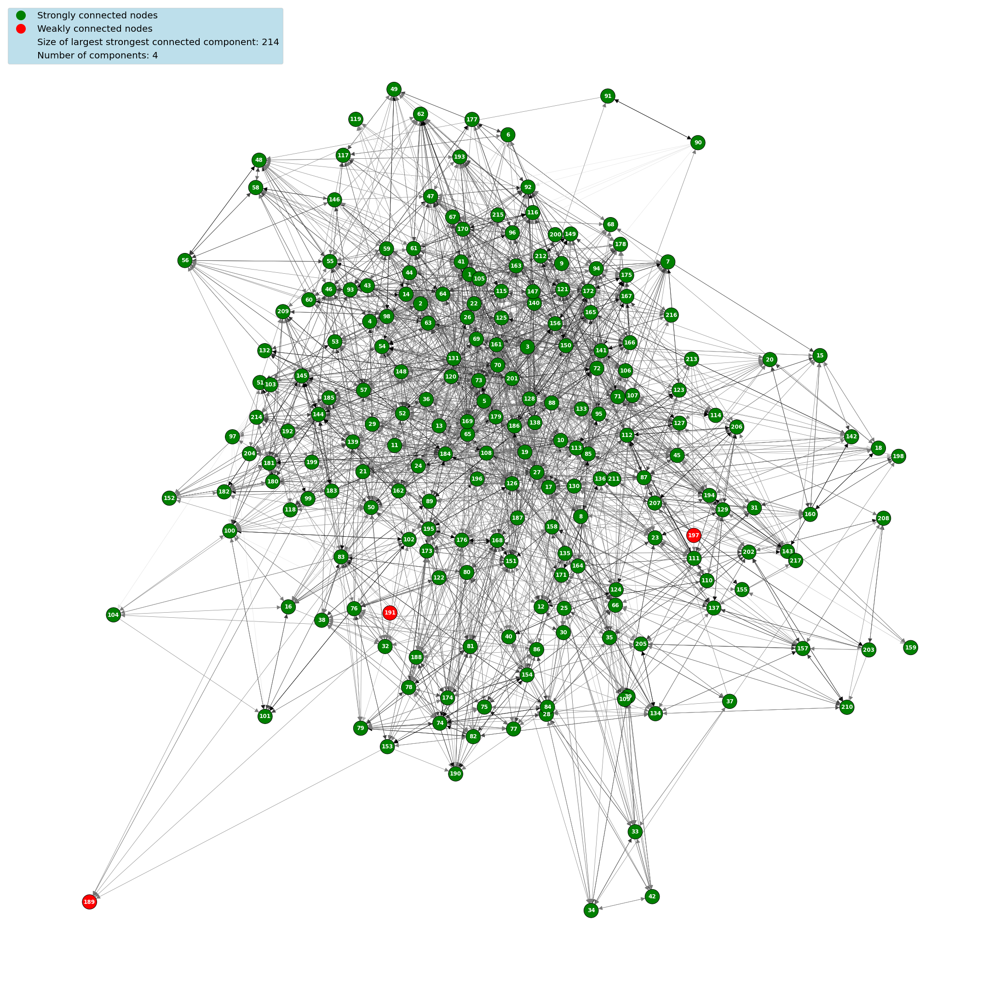

In [26]:
strongly_components = list(nx.strongly_connected_components(G))
largest_strongly = max(strongly_components, key=len)

color_map = ['green' if node in largest_strongly else 'red' for node in G] 
edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

plt.figure(4, figsize=(30, 30))
edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())
nx.draw(G,node_color=color_map, node_size=1000,arrowsize=20, pos=pos_spring, edgelist = edges, edge_color = weights, edge_cmap = plt.cm.Greys, edge_vmin=0.0, edge_vmax=5.0, width=0.7)
nx.draw_networkx_labels(G, pos=pos_spring, horizontalalignment='center', verticalalignment='center',font_color='white', font_weight='bold')
ax=plt.gca()
ax.collections[0].set_edgecolor("#000000")


colors = ["g", "r"]
texts = ["Strongly connected nodes", "Weakly connected nodes"]
patches = [ plt.plot([],[], marker="o", ms=20, ls="", mec=None, color=colors[i], 
            label="{:s}".format(texts[i]) )[0]  for i in range(len(texts)) ]
patches.append(Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0, label=('Size of largest strongest connected component: '+ str(len(largest_strongly)))))
patches.append(Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0, label=('Number of components: '+ str(len(strongly_components)))))
plt.legend(handles=patches,loc=2, ncol=1, facecolor="#add8e6", numpoints=1,fontsize=20)

plt.show()
plt.show()

## Strongly connected components (Kamada Kawai Layout)

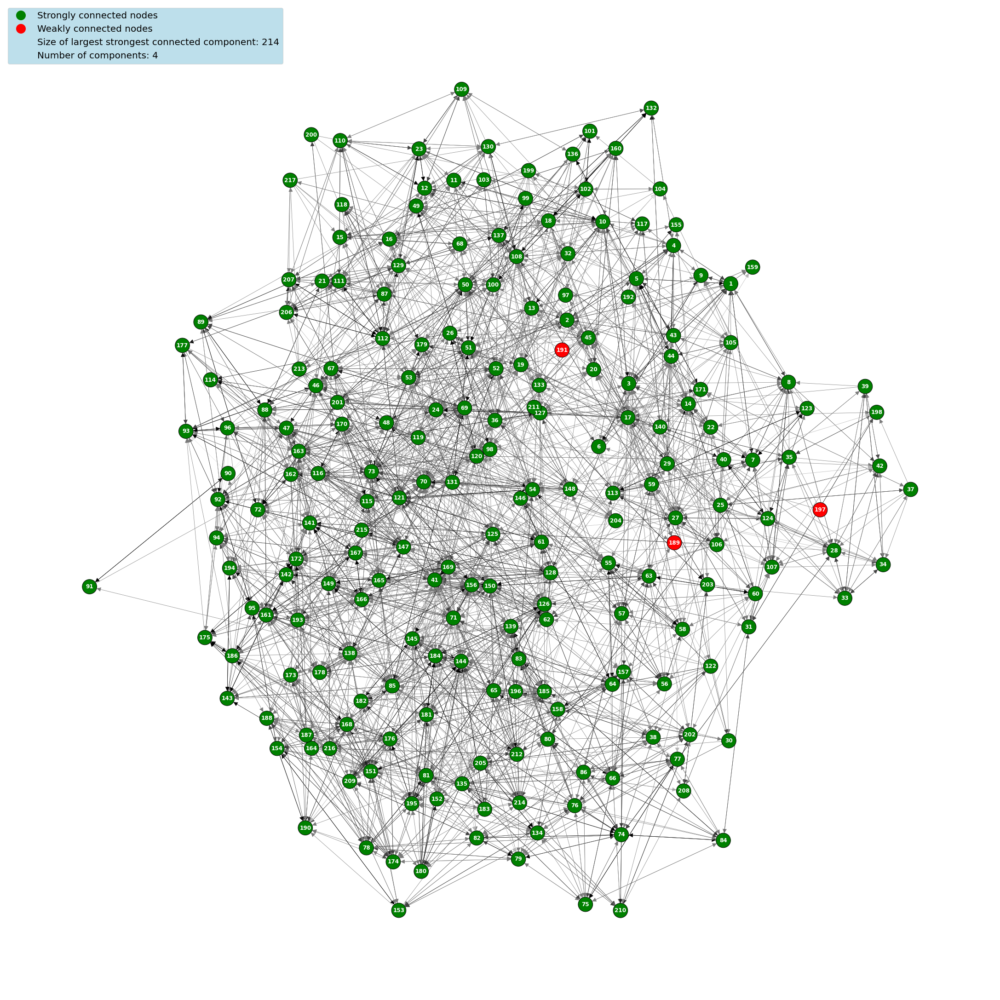

In [28]:
strongly_components = list(nx.strongly_connected_components(G))
largest_strongly = max(strongly_components, key=len)

color_map = ['green' if node in largest_strongly else 'red' for node in G] 
edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())

plt.figure(4, figsize=(30, 30))
edges, weights = zip(*nx.get_edge_attributes(G, 'weight').items())
nx.draw(G,node_color=color_map, node_size=1000,arrowsize=20, pos=pos_kawai, edgelist = edges, edge_color = weights, edge_cmap = plt.cm.Greys, edge_vmin=0.0, edge_vmax=5.0, width=0.7)
nx.draw_networkx_labels(G, pos=pos_kawai, horizontalalignment='center', verticalalignment='center',font_color='white', font_weight='bold')
ax=plt.gca()
ax.collections[0].set_edgecolor("#000000")


colors = ["g", "r"]
texts = ["Strongly connected nodes", "Weakly connected nodes"]
patches = [ plt.plot([],[], marker="o", ms=20, ls="", mec=None, color=colors[i], 
            label="{:s}".format(texts[i]) )[0]  for i in range(len(texts)) ]
patches.append(Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0, label=('Size of largest strongest connected component: '+ str(len(largest_strongly)))))
patches.append(Rectangle((0, 0), 1, 1, fc="w", fill=False, edgecolor='none', linewidth=0, label=('Number of components: '+ str(len(strongly_components)))))
plt.legend(handles=patches,loc=2, ncol=1, facecolor="#add8e6", numpoints=1,fontsize=20)

plt.show()
plt.show()